In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import cufflinks as cf
import plotly.graph_objects as go

In [2]:
close_price_df = pd.read_csv('nasdaq_top_tech.csv')
close_price_df

,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,2013-01-02,16.7057,38.34,12.8655,18.0546,15.2893,27.9159,22.4518,13.1443,0.2935,2.3573
1,2013-01-03,16.4948,37.75,12.9240,18.0651,15.2464,27.6866,22.1510,13.7986,0.2938,2.3180
2,2013-01-04,16.0354,38.13,12.9575,18.4221,15.1320,28.6737,21.7365,13.7114,0.3035,2.2933
3,2013-01-07,15.9411,37.94,13.4230,18.3417,15.1963,29.3317,21.6958,14.1714,0.2947,2.2893
4,2013-01-08,15.9840,38.14,13.3190,18.3055,15.0819,28.9728,21.5820,13.8800,0.2882,2.2453
...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,225.9100,478.08,186.4000,171.1100,21.5200,567.5800,406.3500,756.0300,132.7600,249.8500
2979,2024-11-01,222.9100,482.80,197.9300,171.2900,23.2000,567.1600,410.3700,756.1000,135.4000,248.9800
2980,2024-11-04,222.0100,481.35,195.7800,169.2400,22.5200,560.6800,408.4600,755.5100,136.0500,242.8400
2981,2024-11-05,223.4500,486.42,199.5000,169.7400,23.3200,572.4300,411.4600,763.9100,139.9100,251.4400


In [3]:
daily_return_df = close_price_df.iloc[:,1:].pct_change()*100
daily_return_df.replace(np.nan,0,inplace = True)
daily_return_df

,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-1.262443,-1.538863,0.454704,0.058157,-0.280588,-0.821396,-1.339759,4.977823,0.102215,-1.667162
2,-2.785120,1.006623,0.259208,1.976186,-0.750341,3.565263,-1.871247,-0.631948,3.301566,-1.065574
3,-0.588074,-0.498295,3.592514,-0.436432,0.424927,2.294786,-0.187243,3.354873,-2.899506,-0.174421
4,0.269116,0.527148,-0.774790,-0.197364,-0.752815,-1.223591,-0.524525,-2.056254,-2.205633,-1.921985
...,...,...,...,...,...,...,...,...,...,...
2978,-1.820947,-1.767075,-3.284387,-1.920211,-3.497758,-4.092599,-6.052759,0.303818,-4.722262,-2.989711
2979,-1.327962,0.987282,6.185622,0.105195,7.806691,-0.073998,0.989295,0.009259,1.988551,-0.348209
2980,-0.403750,-0.300331,-1.086243,-1.196801,-2.931034,-1.142535,-0.465434,-0.078032,0.480059,-2.466062
2981,0.648619,1.053288,1.900092,0.295438,3.552398,2.095670,0.734466,1.111832,2.837192,3.541426


In [4]:
daily_return_df.insert(0,"Date",close_price_df['Date'])
daily_return_df

,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,2013-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2013-01-03,-1.262443,-1.538863,0.454704,0.058157,-0.280588,-0.821396,-1.339759,4.977823,0.102215,-1.667162
2,2013-01-04,-2.785120,1.006623,0.259208,1.976186,-0.750341,3.565263,-1.871247,-0.631948,3.301566,-1.065574
3,2013-01-07,-0.588074,-0.498295,3.592514,-0.436432,0.424927,2.294786,-0.187243,3.354873,-2.899506,-0.174421
4,2013-01-08,0.269116,0.527148,-0.774790,-0.197364,-0.752815,-1.223591,-0.524525,-2.056254,-2.205633,-1.921985
...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,-1.820947,-1.767075,-3.284387,-1.920211,-3.497758,-4.092599,-6.052759,0.303818,-4.722262,-2.989711
2979,2024-11-01,-1.327962,0.987282,6.185622,0.105195,7.806691,-0.073998,0.989295,0.009259,1.988551,-0.348209
2980,2024-11-04,-0.403750,-0.300331,-1.086243,-1.196801,-2.931034,-1.142535,-0.465434,-0.078032,0.480059,-2.466062
2981,2024-11-05,0.648619,1.053288,1.900092,0.295438,3.552398,2.095670,0.734466,1.111832,2.837192,3.541426


In [5]:
def plot_financial_data(df,title):
    fig = px.line (title=title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'],y=df[i],name =i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor':"white"})
    fig.show()

In [6]:
plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')

In [7]:
plot_financial_data(daily_return_df,'Percentage Daily Returns [%]')

In [8]:
fig = px.histogram(daily_return_df.drop(columns=['Date']))
fig.update_layout({'plot_bgcolor':"white"})

<Axes: >

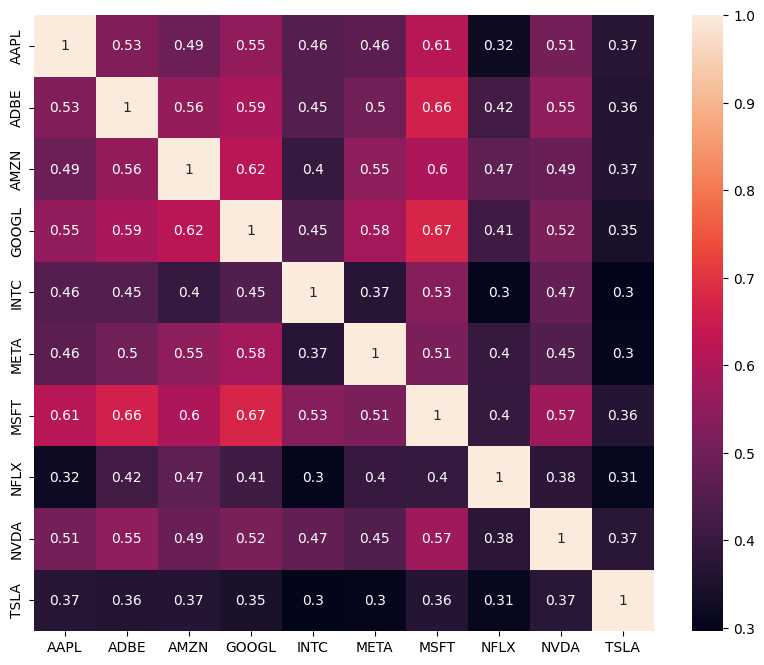

In [9]:
plt.figure(figsize = (10,8))
sns.heatmap(daily_return_df.drop(columns = ['Date']).corr(),annot= True)

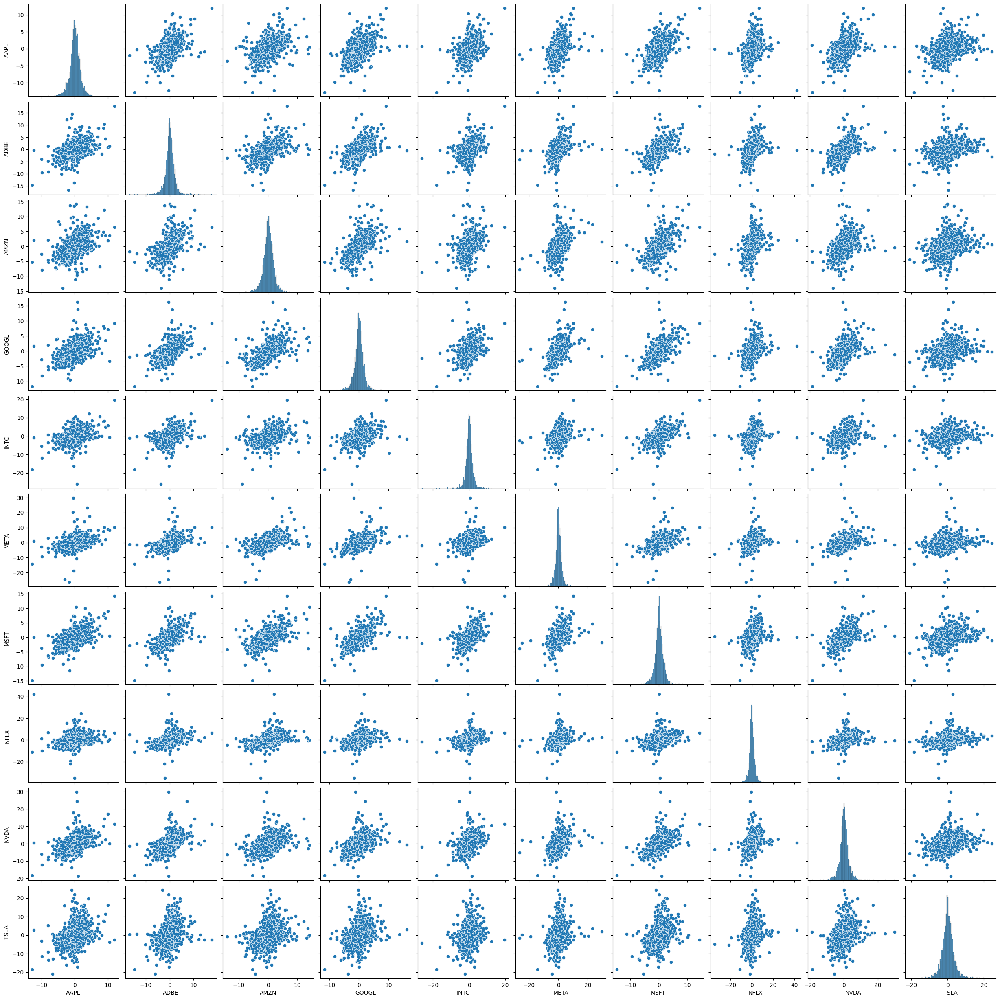

In [10]:
sns.pairplot(daily_return_df)

In [11]:
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
        scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df
price_scaling(close_price_df)


,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,2013-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2013-01-03,0.987376,0.984611,1.004547,1.000582,0.997194,0.991786,0.986602,1.049778,1.001022,0.983328
2,2013-01-04,0.959876,0.994523,1.007151,1.020355,0.989712,1.027146,0.968141,1.043144,1.034072,0.972850
3,2013-01-07,0.954231,0.989567,1.043333,1.015902,0.993917,1.050717,0.966328,1.078140,1.004089,0.971153
4,2013-01-08,0.956799,0.994784,1.035249,1.013897,0.986435,1.037860,0.961259,1.055971,0.981942,0.952488
...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,13.522929,12.469484,14.488360,9.477363,1.407520,20.331782,18.098772,57.517707,452.333901,105.989904
2979,2024-11-01,13.343350,12.592593,15.384556,9.487333,1.517401,20.316737,18.277822,57.523033,461.328790,105.620837
2980,2024-11-04,13.289476,12.554773,15.217442,9.373788,1.472926,20.084611,18.192751,57.478146,463.543441,103.016163
2981,2024-11-05,13.375674,12.687011,15.506587,9.401482,1.525250,20.505518,18.326370,58.117207,476.695060,106.664404


In [12]:
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
    weights = weights/np.sum(weights)
    return weights

# Run multiple times to generate different ouputs
weights = generate_portfolio_weights(4)
print( weights)

[0.0804363  0.46674243 0.18308217 0.26973911]


In [13]:
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,2013-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2013-01-03,0.987376,0.984611,1.004547,1.000582,0.997194,0.991786,0.986602,1.049778,1.001022,0.983328
2,2013-01-04,0.959876,0.994523,1.007151,1.020355,0.989712,1.027146,0.968141,1.043144,1.034072,0.972850
3,2013-01-07,0.954231,0.989567,1.043333,1.015902,0.993917,1.050717,0.966328,1.078140,1.004089,0.971153
4,2013-01-08,0.956799,0.994784,1.035249,1.013897,0.986435,1.037860,0.961259,1.055971,0.981942,0.952488
...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,13.522929,12.469484,14.488360,9.477363,1.407520,20.331782,18.098772,57.517707,452.333901,105.989904
2979,2024-11-01,13.343350,12.592593,15.384556,9.487333,1.517401,20.316737,18.277822,57.523033,461.328790,105.620837
2980,2024-11-04,13.289476,12.554773,15.217442,9.373788,1.472926,20.084611,18.192751,57.478146,463.543441,103.016163
2981,2024-11-05,13.375674,12.687011,15.506587,9.401482,1.525250,20.505518,18.326370,58.117207,476.695060,106.664404


In [14]:
weights = [0.032266, 0.094461, 0.117917, 0.132624, 0.145942, 0.128299, 0.10009, 0.007403, 0.088581, 0.152417]
weights

[0.032266,
 0.094461,
 0.117917,
 0.132624,
 0.145942,
 0.128299,
 0.10009,
 0.007403,
 0.088581,
 0.152417]

In [15]:
initial_investment = 1000000
for i,stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock]=weights[i]*scaled_df[stock]*initial_investment
portfolio_df.round(1)

,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA
0,2013-01-02,32266.0,94461.0,117917.0,132624.0,145942.0,128299.0,100090.0,7403.0,88581.0,152417.0
1,2013-01-03,31858.7,93007.4,118453.2,132701.1,145532.5,127245.2,98749.0,7771.5,88671.5,149876.0
2,2013-01-04,30971.4,93943.6,118760.2,135323.6,144440.5,131781.8,96901.2,7722.4,91599.1,148278.9
3,2013-01-07,30789.2,93475.5,123026.7,134733.0,145054.3,134805.9,96719.8,7981.5,88943.2,148020.3
4,2013-01-08,30872.1,93968.2,122073.5,134467.0,143962.3,133156.4,96212.4,7817.4,86981.4,145175.4
...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,436330.8,1177879.9,1708424.0,1256925.8,205416.3,2608547.3,1811506.0,425803.6,40068189.3,16154663.2
2979,2024-11-01,430536.5,1189508.9,1814100.6,1258248.0,221452.5,2606617.0,1829427.2,425843.0,40864965.6,16098411.2
2980,2024-11-04,428798.2,1185936.4,1794395.1,1243189.3,214961.7,2576835.5,1820912.4,425510.7,41061141.6,15701414.4
2981,2024-11-05,431579.5,1198427.7,1828490.3,1246862.2,222598.0,2630837.5,1834286.4,430241.7,42226125.1,16257468.5


In [16]:
def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [17]:

n = len(close_price_df.columns)-1

print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 10
Portfolio weights = [0.147401 0.08179  0.110958 0.08701  0.157933 0.1192   0.100581 0.060684
 0.026477 0.107966]


,Date,AAPL,ADBE,AMZN,GOOGL,INTC,META,MSFT,NFLX,NVDA,TSLA,Portfolio Value [$],Portfolio Daily Return [%]
0,2013-01-02,147401.00,81790.00,110958.00,87010.00,157933.00,119200.00,100581.00,60684.00,26477.00,107966.00,1000000.00,0.00
1,2013-01-03,145540.15,80531.36,111462.53,87060.60,157489.86,118220.90,99233.46,63704.74,26504.06,106166.03,995913.69,-0.41
2,2013-01-04,141486.68,81342.01,111751.45,88781.08,156308.15,122435.78,97376.55,63302.16,27379.11,105034.75,995197.73,-0.07
3,2013-01-07,140654.63,80936.69,115766.14,88393.61,156972.34,125245.42,97194.22,65425.87,26585.25,104851.55,1002025.73,0.69
4,2013-01-08,141033.16,81363.34,114869.19,88219.15,155790.63,123712.93,96684.41,64080.55,25998.88,102836.32,994588.57,-0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2978,2024-10-31,1993293.30,1019879.06,1607599.49,824625.36,222293.90,2423548.44,1820392.55,3490404.55,11976444.70,11443305.94,36821787.30,-3.39
2979,2024-11-01,1966823.11,1029948.15,1707039.52,825492.83,239647.70,2421755.06,1838401.60,3490727.72,12214602.39,11403459.33,37137897.41,0.86
2980,2024-11-04,1958882.06,1026854.89,1688496.93,815613.33,232623.54,2394085.66,1829845.06,3488003.84,12273239.69,11122243.01,36829888.01,-0.83
2981,2024-11-05,1971587.75,1037670.63,1720579.92,818022.96,240887.26,2444257.79,1843284.65,3526784.57,12621455.09,11516129.06,37740659.68,2.47


In [18]:
plot_financial_data(portfolio_df[['Date','Portfolio Daily Return [%]']],'Portfolio Percentage Daily Return [%]')

plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

plot_financial_data(portfolio_df[['Date','Portfolio Value [$]']],'Total Porfolio Value [$]')

In [19]:
def simulation_engine(weights, initial_investment):

    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)

    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:]-
                             portfolio_df['Portfolio Value [$]'][0])/
                             portfolio_df['Portfolio Value [$]'][0])*100
    
    portfolio_daily_return_df = portfolio_df.drop(columns=['Date','Portfolio Value [$]','Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1)

    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() )*252

    covariance = portfolio_daily_return_df.cov() * 252
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance,weights)))
    rf = 0.01

    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]


In [20]:
initial_investment =100000
portfolio_metrics = simulation_engine(weights,initial_investment)

In [21]:

print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0]*100))
print('Portfolio Standard Deviation (Volatility)= {:.2f}%'.format(portfolio_metrics[1]*100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = ${:.2f}'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 30.06%
Portfolio Standard Deviation (Volatility)= 25.02%
Sharpe Ratio = 1.16
Portfolio Final Value = $4021509.58
Return on Investment = $3921.51


In [22]:
# Run Monte Carlo Simulations

In [23]:
sim_runs = 10000
initial_investment = 1000000

weights_runs = np.zeros((sim_runs,n))

sharpe_ratio_runs = np.zeros(sim_runs)

expected_portfolio_returns_run = np.zeros(sim_runs)

volatility_runs = np.zeros(sim_runs)

return_on_investment_runs = np.zeros(sim_runs)

final_value_runs = np.zeros(sim_runs)

for i in range (sim_runs):
    weights = generate_portfolio_weights(n)
    weights_runs[i,:] = weights
    expected_portfolio_returns_run[i],volatility_runs[i],sharpe_ratio_runs[i],final_value_runs[i],return_on_investment_runs[i] = simulation_engine(weights,initial_investment)

    print("Simulation Run = {}".format(i))
    print("weights = {},Final Value = ${:.2f},Sharpe Ratio = {:2.2f}".format(weights_runs[i].round(3),final_value_runs[i],sharpe_ratio_runs[i]))
    print('\n')

Simulation Run = 0
weights = [0.245 0.108 0.127 0.053 0.089 0.033 0.075 0.083 0.146 0.042],Final Value = $91974709.74,Sharpe Ratio = 1.27


Simulation Run = 1
weights = [0.126 0.062 0.071 0.028 0.098 0.144 0.138 0.041 0.181 0.112],Final Value = $115418458.05,Sharpe Ratio = 1.33


Simulation Run = 2
weights = [0.194 0.065 0.068 0.181 0.043 0.118 0.077 0.076 0.08  0.098],Final Value = $66482347.50,Sharpe Ratio = 1.28


Simulation Run = 3
weights = [0.058 0.136 0.115 0.168 0.044 0.097 0.062 0.133 0.083 0.104],Final Value = $71186287.22,Sharpe Ratio = 1.28


Simulation Run = 4
weights = [0.089 0.07  0.068 0.081 0.113 0.083 0.162 0.107 0.1   0.128],Final Value = $80307361.56,Sharpe Ratio = 1.29


Simulation Run = 5
weights = [0.175 0.081 0.059 0.152 0.054 0.062 0.082 0.188 0.077 0.068],Final Value = $66555403.79,Sharpe Ratio = 1.29


Simulation Run = 6
weights = [0.078 0.107 0.102 0.273 0.02  0.047 0.146 0.032 0.185 0.011],Final Value = $105439578.83,Sharpe Ratio = 1.27


Simulation Run = 7

In [24]:
#Return the minimum Sharpe ratio
sharpe_ratio_runs.min().round(4)
# Min Sharpe Ratio after 10000 run  = 0.891

np.float64(0.9495)

In [25]:
weights_runs[sharpe_ratio_runs.argmax(),:]

array([0.10830414, 0.06088109, 0.01710026, 0.07289006, 0.00628017,
       0.07515848, 0.04610693, 0.23003299, 0.26195657, 0.12128932])

In [26]:
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print(' - Portfolio Expected Annual Return = {:.2f}%'.format(optimal_portfolio_return*100))
print(' - Portfolio Standard Deviation (Volatility)= {:.2f}%'.format(optimal_volatility*100))
print(' - Sharpe Ratio = {:.2f}'.format(optimal_sharpe_ratio))
print(' - Final Value = ${:.2f}'.format(highest_final_value))
print(' - Return on Investment = {:.2f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
 - Portfolio Expected Annual Return = 44.13%
 - Portfolio Standard Deviation (Volatility)= 29.82%
 - Sharpe Ratio = 1.45
 - Final Value = $164107280.92
 - Return on Investment = 16310.73%


In [27]:
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_run.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.254647,0.334378,1.273834
1,0.269619,0.367526,1.326038
2,0.253619,0.333754,1.276539
3,0.263373,0.348247,1.284293
4,0.261461,0.347445,1.290614
...,...,...,...
9995,0.245735,0.301593,1.186616
9996,0.265283,0.303874,1.107778
9997,0.276693,0.377621,1.328621
9998,0.262333,0.327476,1.210202


In [28]:
fig_1 = px.scatter(sim_out_df,x ='Volatility',y = 'Portfolio_Return',color = 'Sharpe_Ratio',size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'])
fig_1.update_layout({'plot_bgcolor':"white"})
fig_1.show()

In [29]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

In [30]:
fig = px.line(sim_out_df,y ='Volatility')
fig.show()

In [31]:
fig = px.line(sim_out_df,y = 'Portfolio_Return')
fig.update_traces(line_color = 'red')
fig.show()

In [32]:
fig = px.line(sim_out_df,y='Sharpe_Ratio')
fig.update_traces(line_color = 'purple')
fig.show()